# Doctor Type ML Models - Decision Tree & Random Forest
Amy Jin

6/28/2018, py27

### 5.2.2 Decision Trees

Decision Trees are versatile Machine Learning algorithms that can perform both classification and regression tasks, and even multioutput tasks. They are very powerful alogritms, capable of fitting complex datasets. Decisions Trees are also fundamental components of Random Forest (will do later), which are among the most powerful ML algorithms available today.

Here is a great tutorial on how Decision Trees work: https://dataaspirant.com/2017/01/30/how-decision-tree-algorithm-works/. 

#### Importing Python Machine Learning Libraries & Dataset

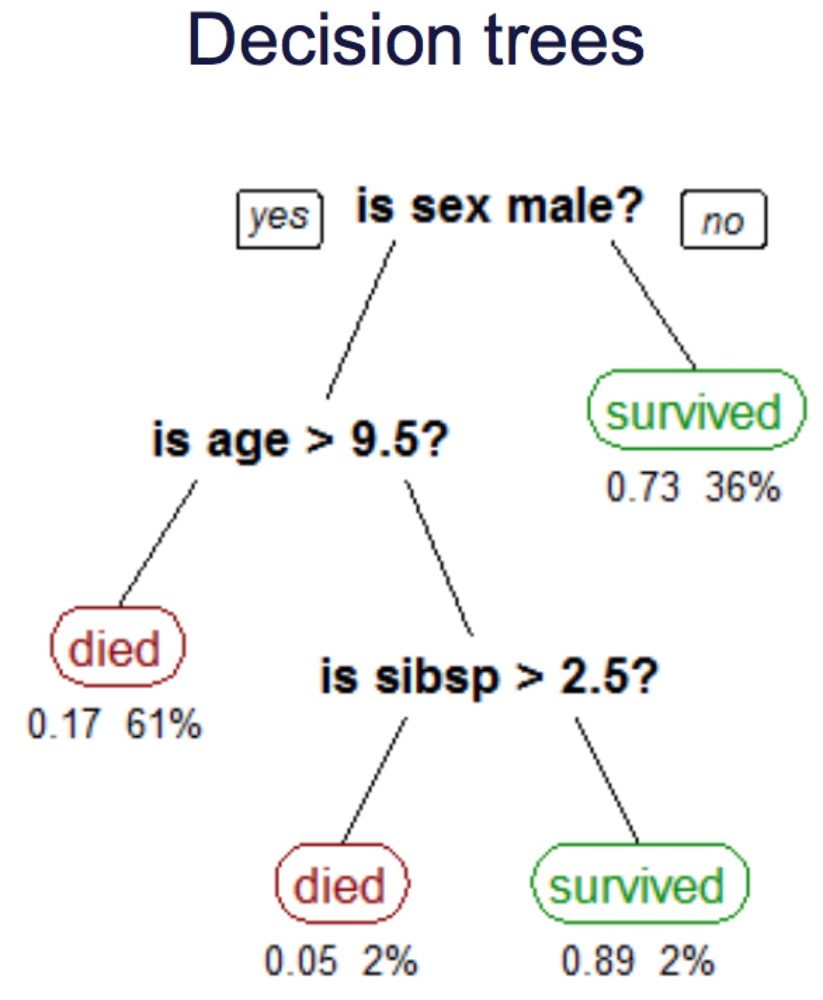

In [3]:
from IPython.display import Image
Image(filename='tree_example.jpg',width=250, height=250)

In [1]:
# Load libraries
import pandas as pd
import seaborn as sns
import numpy as np
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
#Import Random Forest Model
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from imblearn.over_sampling import SMOTE
data = pd.read_csv("/Users/yuejin/Documents/AmyJin_2018/Work/Test/2018_03/Doctor_Type_ML/final_table2.csv")
train, test = train_test_split(data, test_size=0.2, random_state = 100)
X_train = train.iloc[:,4:14]
y_train = train.iloc[:,1]
X_test = test.iloc[:,4:14]
y_test = test.iloc[:,1]

#### Decision Tree Training
Now we fit Decision tree algorithm on training data, predicting labels for validation dataset and printing the accuracy of the model using various parameters.

* DecisionTreeClassifier(): This is the classifier function for DecisionTree. It is the main function for implementing the algorithms. Some important parameters are:

* criterion: It defines the function to measure the quality of a split. Sklearn supports “gini” criteria for Gini Index & “entropy” for Information Gain. By default, it takes “gini” value.
* splitter: It defines the strategy to choose the split at each node. Supports “best” value to choose the best split & “random” to choose the best random split. By default, it takes “best” value.
* max_features: It defines the no. of features to consider when looking for the best split. We can input integer, float, string & None value.
 - If an integer is inputted then it considers that value as max features at each split.
 - If float value is taken then it shows the percentage of features at each split.
 - If “auto” or “sqrt” is taken then max_features=sqrt(n_features).
 - If “log2” is taken then max_features= log2(n_features).
 - If None, then max_features=n_features. By default, it takes “None” value.
* max_depth: The max_depth parameter denotes maximum depth of the tree. It can take any integer value or None. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples. By default, it takes “None” value.
* min_samples_split: This tells above the minimum no. of samples reqd. to split an internal node. If an integer value is taken then consider min_samples_split as the minimum no. If float, then it shows percentage. By default, it takes “2” value.
* min_samples_leaf: The minimum number of samples required to be at a leaf node. If an integer value is taken then consider min_samples_leaf as the minimum no. If float, then it shows percentage. By default, it takes “1” value.
* max_leaf_nodes: It defines the maximum number of possible leaf nodes. If None then it takes an unlimited number of leaf nodes. By default, it takes “None” value.
* min_impurity_split: It defines the threshold for early stopping tree growth. A node will split if its impurity is above the threshold otherwise it is a leaf.

To understand DT, let's build one simplest tree using criterion as gini index and information gain and look at how it makes predictions. 

#### 1) Decision Tree Classifier with criterion gini index

In [2]:
clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 100,
                               max_depth=3, min_samples_leaf=5)
clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

In [3]:
DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
            max_features=None, max_leaf_nodes=None, min_samples_leaf=5,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=100, splitter='best')

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

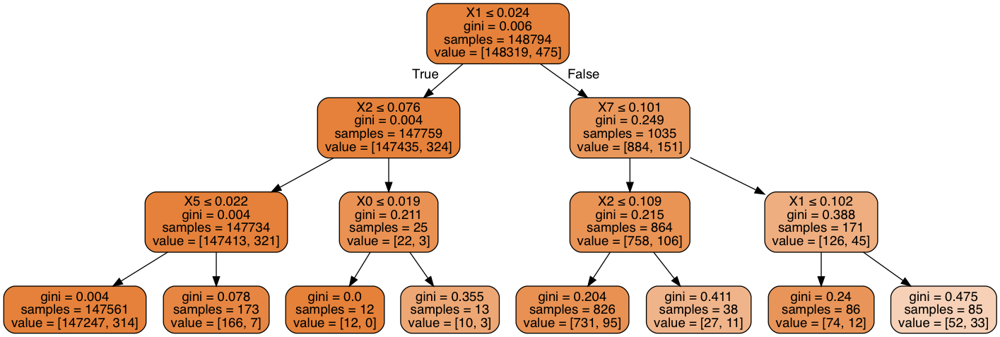

In [4]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf_gini, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

Prediction for Decision Tree classifier with criterion as gini index:

In [5]:
y_pred = clf_gini.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

#### Performance of Model

How does the model work for unknown test data? 

Accuracy of Decision Trees with Gini Index classifier on test set: 0.9969354014892874
             precision    recall  f1-score   support

          0       1.00      1.00      1.00     37085
          1       0.00      0.00      0.00       114

avg / total       0.99      1.00      1.00     37199



/Users/yuejin/miniconda3/envs/py27/lib/python2.7/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


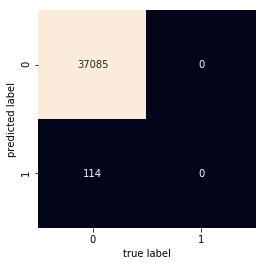

In [6]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
#print(confusion_matrix)
sns.heatmap(confusion_matrix, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');
print('Accuracy of Decision Trees with Gini Index classifier on test set: {:.16f}'.format(clf_gini.score(X_test, y_test)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
# preds = clf_gini.predict_proba(X_test)[:,1]
# fpr, tpr, _ = metrics.roc_curve(y_test, preds)
# df = pd.DataFrame(dict(fpr=fpr, tpr=tpr))

# plt.plot(fpr, tpr)
# plt.ylabel('True Positive Rate/Sensitivity')
# plt.xlabel('False Positive Rate/1-Specificity')
# plt.grid(True)
# plt.title('ROC Curve')
# plt.show()
# roc_auc_score(y_test, preds)

#### 2) Decision Tree Classifier with criterion information gain

In [7]:
clf_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100, max_depth=3, min_samples_leaf=5)
clf_entropy.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=3,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

In [8]:
DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=3,
            max_features=None, max_leaf_nodes=None, min_samples_leaf=5,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=100, splitter='best')

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=3,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

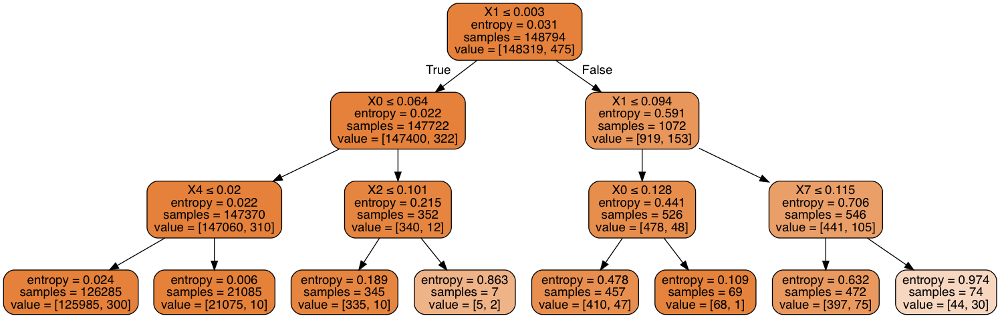

In [9]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf_entropy, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [10]:
y_pred = clf_entropy.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

#### Performance of Model

How does the model work for unknown test data? 

Accuracy of Decision Trees with Gini Index classifier on test set: 0.9969354014892874
             precision    recall  f1-score   support

          0       1.00      1.00      1.00     37085
          1       0.00      0.00      0.00       114

avg / total       0.99      1.00      1.00     37199



/Users/yuejin/miniconda3/envs/py27/lib/python2.7/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


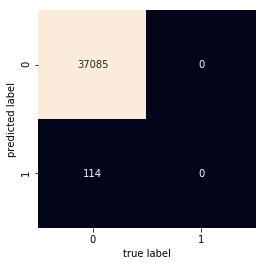

In [11]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
#print(confusion_matrix)
sns.heatmap(confusion_matrix, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');
print('Accuracy of Decision Trees with Gini Index classifier on test set: {:.16f}'.format(clf_entropy.score(X_test, y_test)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
# preds = clf_gini.predict_proba(X_test)[:,1]
# fpr, tpr, _ = metrics.roc_curve(y_test, preds)
# df = pd.DataFrame(dict(fpr=fpr, tpr=tpr))

# plt.plot(fpr, tpr)
# plt.ylabel('True Positive Rate/Sensitivity')
# plt.xlabel('False Positive Rate/1-Specificity')
# plt.grid(True)
# plt.title('ROC Curve')
# plt.show()
# roc_auc_score(y_test, preds)

From results, we can see that we get similar result with both gini index and info gain. The results are not good enough, both have 0 true positive. To increase our accuracy, we could try tune the number of branches or ensemble learning, such as Random Forest. Let's try to tune the trees first. 

### Tuning Tree Branches
Try to tune model with gini index here. 

In [12]:
clf_gini_2 = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=100, splitter='best')
clf_gini_2.fit(X_train, y_train)

/Users/yuejin/miniconda3/envs/py27/lib/python2.7/site-packages/sklearn/tree/tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=1e-07,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

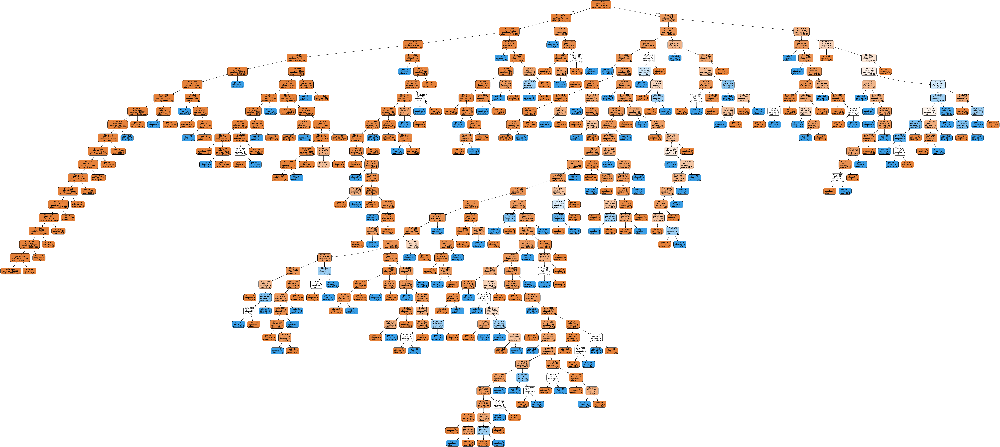

In [13]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf_gini_2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [14]:
y_pred = clf_gini_2.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

[[37035    50]
 [  107     7]]
Accuracy of Decision Trees with Gini Index classifier on test set: 0.9957794564370009
             precision    recall  f1-score   support

          0       1.00      1.00      1.00     37085
          1       0.12      0.06      0.08       114

avg / total       0.99      1.00      1.00     37199



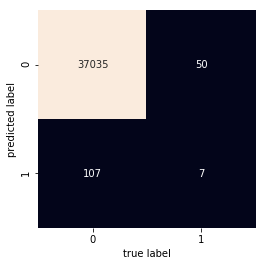

In [15]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)
sns.heatmap(confusion_matrix, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');
print('Accuracy of Decision Trees with Gini Index classifier on test set: {:.16f}'.format(clf_gini_2.score(X_test, y_test)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
# preds = clf_gini.predict_proba(X_test)[:,1]
# fpr, tpr, _ = metrics.roc_curve(y_test, preds)
# df = pd.DataFrame(dict(fpr=fpr, tpr=tpr))

The recall increases after tuning the number of splits. 

### Tuning Tree Branches with Balanced Train Data

In [16]:
X_train = train.iloc[:,4:14]
y_train = train.iloc[:,1]
X_test = test.iloc[:,4:14]
y_test = test.iloc[:,1]
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
X_resampled, y_resampled = ros.fit_sample(X_train, y_train)
from collections import Counter
print(sorted(Counter(y_resampled).items()))
print X_resampled.shape, y_resampled.shape
print X_train.shape, y_train.shape

[(0, 148319), (1, 148319)]
(296638, 10) (296638,)
(148794, 10) (148794,)


In [17]:
clf_gini_3 = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_split=1e-07, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')
clf_gini_3.fit(X_resampled, y_resampled)

/Users/yuejin/miniconda3/envs/py27/lib/python2.7/site-packages/sklearn/tree/tree.py:282: DeprecationWarning: The min_impurity_split parameter is deprecated and will be removed in version 0.21. Use the min_impurity_decrease parameter instead.
  DeprecationWarning)


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=1e-07,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

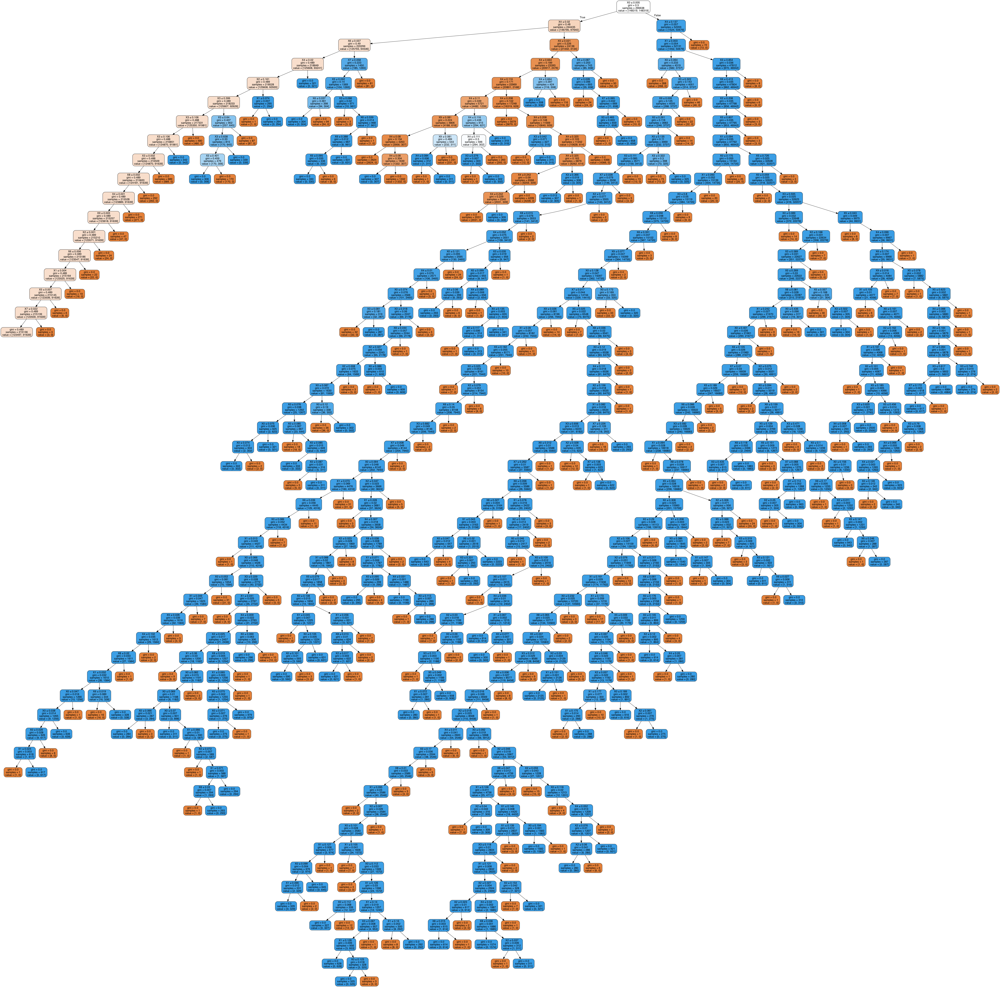

In [18]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf_gini_3, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [19]:
y_pred = clf_gini_3.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

Accuracy of Decision Trees with Gini Index classifier on test set: 0.9957794564370009
             precision    recall  f1-score   support

          0       1.00      1.00      1.00     37085
          1       0.19      0.07      0.10       114

avg / total       0.99      1.00      1.00     37199



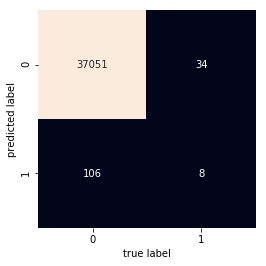

In [20]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
#print(confusion_matrix)
sns.heatmap(confusion_matrix, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');
print('Accuracy of Decision Trees with Gini Index classifier on test set: {:.16f}'.format(clf_gini_2.score(X_test, y_test)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
# preds = clf_gini.predict_proba(X_test)[:,1]
# fpr, tpr, _ = metrics.roc_curve(y_test, preds)
# df = pd.DataFrame(dict(fpr=fpr, tpr=tpr))

# plt.plot(fpr, tpr)
# plt.ylabel('True Positive Rate/Sensitivity')
# plt.xlabel('False Positive Rate/1-Specificity')
# plt.grid(True)
# plt.title('ROC Curve')
# plt.show()
# roc_auc_score(y_test, preds)

The following are tuning parameters, we can choose different values/options to find the best model.
   * class_weight=None, criterion='gini', max_depth=None,
     max_features=None, max_leaf_nodes=None,
     min_impurity_split=1e-07, min_samples_leaf=1,
     min_samples_split=2, min_weight_fraction_leaf=0.0,
     presort=False, splitter='best' *

### 5.2.3 Random Forest

A forest is comprised of trees. It is said that the more trees it has, the more robust a forest is. Random forests creates decision trees on randomly selected data samples, gets prediction from each tree and selects the best solution by means of voting. It also provides a pretty good indicator of the feature importance.

It technically is an ensemble method of decision trees generated on a randomly split dataset. This collection of decision tree classifiers is also known as the forest. The individual decision trees are generated using an attribute selection indicator such as information gain, gain ratio, and Gini index for each attribute. Each tree depends on an independent random sample. In a classification problem, each tree votes and the most popular class is chosen as the final result. In the case of regression, the average of all the tree outputs is considered as the final result. It is simpler and more powerful compared to the other non-linear classification algorithms.

#### How does the algorithm work?
It works in four steps:

* Select random samples from a given dataset.
* Construct a decision tree for each sample and get a prediction result from each decision tree.
* Perform a vote for each predicted result.
* Select the prediction result with the most votes as the final prediction.

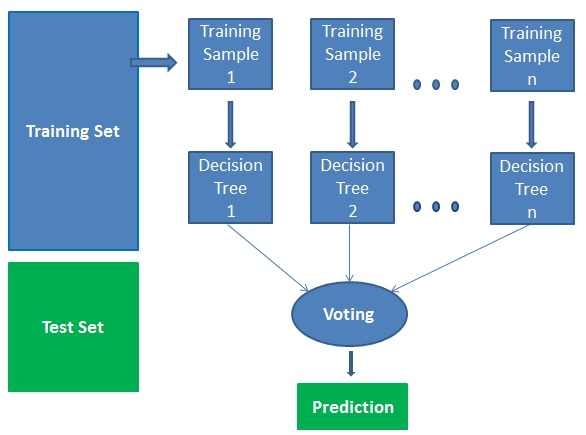

In [21]:
from IPython.display import Image
Image(filename='randomforest.png')

#### Build Model and Make Predictions

In [22]:
#Create a Gaussian Classifier
clf_RF = RandomForestClassifier(n_estimators=100)
#Train the model using the training sets y_pred=clf.predict(X_test)
clf_RF.fit(X_train,y_train)

y_pred=clf_RF.predict(X_test)

#### RF Performance

Accuracy of Random Forest classifier on test set: 0.9968009892739053
             precision    recall  f1-score   support

          0       1.00      1.00      1.00     37085
          1       0.22      0.02      0.03       114

avg / total       0.99      1.00      1.00     37199



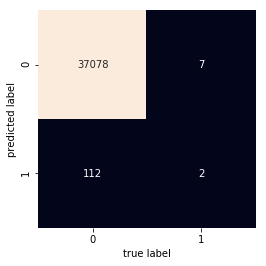

In [23]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
#print(confusion_matrix)
sns.heatmap(confusion_matrix, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');
print('Accuracy of Random Forest classifier on test set: {:.16f}'.format(clf_RF.score(X_test, y_test)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
# preds = clf_RF.predict_proba(X_test)[:,1]
# fpr, tpr, _ = metrics.roc_curve(y_test, preds)
# df = pd.DataFrame(dict(fpr=fpr, tpr=tpr))

# plt.plot(fpr, tpr)
# plt.ylabel('True Positive Rate/Sensitivity')
# plt.xlabel('False Positive Rate/1-Specificity')
# plt.grid(True)
# plt.title('ROC Curve')
# plt.show()
# roc_auc_score(y_test, preds)

#### Find Important Features 

In scikit-learn, we can perform this task in the following steps:

 - First, you need to create a random forests model.
 - Second, use the feature importance variable to see feature importance scores.
 - Third, visualize these scores using the seaborn library.

In [24]:
from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
clf_RF =RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf_RF.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [25]:
import pandas as pd
feature_imp = pd.Series(clf_RF.feature_importances_, index = list(X_train)).sort_values(ascending=False)
feature_imp

X_96413    0.225895
X_96367    0.195205
X_96361    0.126544
X_80053    0.097969
X_G0008    0.094549
X_83615    0.078314
X_82728    0.065688
X_83550    0.056277
X_J3490    0.035431
X_Q2037    0.024128
dtype: float64

In [26]:
list(X_train) # 0, 1,2,3,4,5,

['X_96413',
 'X_96367',
 'X_96361',
 'X_80053',
 'X_G0008',
 'X_83615',
 'X_82728',
 'X_83550',
 'X_J3490',
 'X_Q2037']

From the above results, we can see the rank of feature importance. We could also visualize the feature importance.

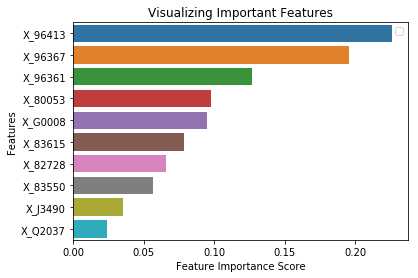

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

#### Generating the Model on Selected Features
Here, we can remove the features with lowest importance because they are less important compared to others, and select the 6 remaining features

In [28]:
#Create a Gaussian Classifier
clf_RF_2 = RandomForestClassifier(n_estimators=100)
#Train the model using the training sets y_pred=clf.predict(X_test)
clf_RF_2.fit(X_train.iloc[:,[0,1,2,3,4,5]],y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [29]:
y_pred=clf_RF_2.predict(X_test.iloc[:,[0,1,2,3,4,5]])

Accuracy of Random Forest with selected features on test set: 0.9966934595015995
             precision    recall  f1-score   support

          0       1.00      1.00      1.00     37085
          1       0.09      0.01      0.02       114

avg / total       0.99      1.00      1.00     37199



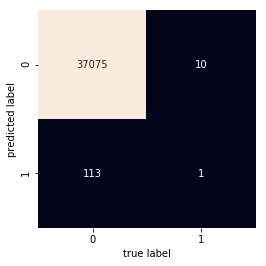

In [30]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
#print(confusion_matrix)
sns.heatmap(confusion_matrix, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');
print('Accuracy of Random Forest with selected features on test set: {:.16f}'.format(clf_RF_2.score(X_test.iloc[:,[0,1,2,3,4,5]], y_test)))
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))
# preds = clf_RF.predict_proba(X_test)[:,1]
# fpr, tpr, _ = metrics.roc_curve(y_test, preds)
# df = pd.DataFrame(dict(fpr=fpr, tpr=tpr))

# plt.plot(fpr, tpr)
# plt.ylabel('True Positive Rate/Sensitivity')
# plt.xlabel('False Positive Rate/1-Specificity')
# plt.grid(True)
# plt.title('ROC Curve')
# plt.show()
# roc_auc_score(y_test, preds)

We can see that after removing the least important features, the accuracy and recall increased a little bit. This is because we removed misleading data and noise, resulting in an increased accuracy. Moreover, a lesser amount of features also reduces the training time.

Random Forests vs Decision Trees: 
* Random forests is a set of multiple decision trees.
* Deep decision trees may suffer from overfitting, but random forests prevents overfitting by creating trees on random subsets.
* Decision trees are computationally faster.
* Random forests is difficult to interpret, while a decision tree is easily interpretable and can be converted to rules.

Reference: http://dataaspirant.com/2017/02/01/decision-tree-algorithm-python-with-scikit-learn/
https://www.python-course.eu/Decision_Trees.php 
https://www.datacamp.com/community/tutorials/random-forests-classifier-python